# CIND820 Analytics Project
# Controlling a Pandemic: Analyzing Key Factors in COVID-19 Outcomes by Country
Dataset: Our world in COVID-19
https://github.com/owid/covid-19-data/raw/master/public/
- this dataset is an amalgamate of many government data sources and John Hopkins University Research Center
- Dataset Codebook is available at the above github link

## Project Purpose
- This project is to shed light on the different attributes that may affect COVID spread and fatalities
- The aim is to discover the important trends, and find the most important demographic factors through visual trend analysis
- Another goal of this project is to develop an ARIMA model to forecast cases and deaths for Canada for the next 30 days
- This project will heavily focus on visualizations and exploratory data analysis, with forecasting as the final component

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
from datetime import datetime
from math import sqrt
import itertools
import warnings
warnings.simplefilter('ignore')

#Visualization
#!pip install plotly_express
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

#Modeling and evaluation
import statsmodels.api as sm
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor, ExtraTreesClassifier
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report

sns.set_style("darkgrid")

In [2]:
OWIDdf = pd.read_csv('https://github.com/owid/covid-19-data/raw/master/public/data/owid-covid-data.csv')

In [3]:
OWIDdfc = OWIDdf.copy()

In [4]:
OWIDdfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84310 entries, 0 to 84309
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               84310 non-null  object 
 1   continent                              80235 non-null  object 
 2   location                               84310 non-null  object 
 3   date                                   84310 non-null  object 
 4   total_cases                            82276 non-null  float64
 5   new_cases                              82274 non-null  float64
 6   new_cases_smoothed                     81273 non-null  float64
 7   total_deaths                           72644 non-null  float64
 8   new_deaths                             72802 non-null  float64
 9   new_deaths_smoothed                    81273 non-null  float64
 10  total_cases_per_million                81831 non-null  float64
 11  ne

# Data Cleaning

- columns will be removed based on relevance
- due to the data being relatively recent, with varying underreporting rates by region, some data is unavailable
- however it is difficult to eliminate variables by NA values alone
- each variable even with relatively little rows can still be valuable for visual analysis
- some columns have less than 10000 non-null values, but may be kept due to high relevance. ie. new vaccinations
- these columns will be useful for analysis and visualization, but may be dropped in modeling


In [5]:
OWIDdfc.head()

,iso_code,continent,location,date,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
0,AFG,Asia,Afghanistan,2020-02-24,1.0,1.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
1,AFG,Asia,Afghanistan,2020-02-25,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
2,AFG,Asia,Afghanistan,2020-02-26,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
3,AFG,Asia,Afghanistan,2020-02-27,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511
4,AFG,Asia,Afghanistan,2020-02-28,1.0,0.0,NaN,NaN,NaN,NaN,...,1803.987,NaN,597.029,9.59,NaN,NaN,37.746,0.5,64.83,0.511


In [5]:
OWIDdfc.describe()
#many nonsensical negative values like -min in new_deaths columns.

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
count,8.207700e+04,82075.000000,81074.000000,7.245300e+04,72611.000000,81074.000000,81633.000000,81631.000000,80635.000000,72022.000000,...,76085.000000,51824.000000,76686.000000,77791.000000,60097.000000,59210.000000,38532.000000,69996.000000,79811.000000,76577.000000
mean,8.058046e+05,5718.143210,5692.332794,2.260774e+04,137.791588,121.926315,9810.522168,73.739235,73.740246,220.252612,...,19137.638386,13.341685,257.730075,7.816339,10.518013,32.654195,50.924176,3.029781,73.165781,0.727181
std,5.579207e+06,35538.797526,34813.794708,1.335640e+05,751.191619,687.112308,18872.369979,175.304516,148.777174,386.996673,...,19814.502945,19.940374,118.749424,3.970896,10.399452,13.475618,31.763667,2.464015,7.549052,0.150064
min,1.000000e+00,-74347.000000,-6223.000000,1.000000e+00,-1918.000000,-232.143000,0.001000,-2153.437000,-276.825000,0.001000,...,661.240000,0.100000,79.370000,0.990000,0.100000,7.700000,1.188000,0.100000,53.280000,0.394000
25%,9.070000e+02,2.000000,6.857000,4.400000e+01,0.000000,0.000000,197.460000,0.183000,1.136000,6.765000,...,4466.507000,0.500000,167.295000,5.290000,1.900000,21.600000,20.859000,1.300000,67.920000,0.602000
50%,1.010500e+04,69.000000,84.286000,3.090000e+02,2.000000,1.143000,1347.588000,7.517000,9.922000,38.216000,...,12951.839000,2.200000,242.648000,7.110000,6.300000,31.400000,49.839000,2.400000,74.530000,0.748000
75%,1.077430e+05,755.000000,784.678250,3.000000e+03,17.000000,13.429000,9653.642000,66.506500,74.427000,235.574250,...,27216.445000,21.200000,329.635000,10.080000,19.300000,41.100000,83.241000,3.861000,78.730000,0.848000
max,1.471896e+08,899755.000000,826374.286000,3.109247e+06,17906.000000,14435.143000,169028.668000,8652.658000,2648.773000,2756.111000,...,116935.600000,77.600000,724.417000,30.530000,44.000000,78.100000,98.999000,13.800000,86.750000,0.957000


## Negative Data 
- some columns have negative data: new_cases_ columns
- the codebook does not mention any reasons for negative data so it is assumed to be typoes and filtered out

In [6]:
df = OWIDdfc.copy()
df.new_cases.min()

-74347.0

Absolute values of columns with negative values

In [8]:
#new_cols = [col for col in df.columns if 'new' in col]
#new_cols

#df[new_cols] = abs(df[new_cols])

#df[new_cols].describe()

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80322 entries, 0 to 80321
Data columns (total 59 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   iso_code                               80322 non-null  object 
 1   continent                              76409 non-null  object 
 2   location                               80322 non-null  object 
 3   date                                   80322 non-null  object 
 4   total_cases                            78694 non-null  float64
 5   new_cases                              78692 non-null  float64
 6   new_cases_smoothed                     77691 non-null  float64
 7   total_deaths                           69218 non-null  float64
 8   new_deaths                             69376 non-null  float64
 9   new_deaths_smoothed                    77691 non-null  float64
 10  total_cases_per_million                78267 non-null  float64
 11  ne

In [10]:
#some of this information is too sparse to analyse, and is somewhat redundant when we are already analysing death rates
df.drop(columns=df.columns[17:25].tolist(), inplace=True)

In [11]:
df_dropcol = df.copy()

In [27]:
#date indexing
df['date'] = pd.to_datetime(df['date'])
df = df.set_index('date')

In [13]:
df_world = df[df.location=='World']
df = df[-df.location.isin(['World'])]

# Exploratory Data Analysis
- this dataset has time-series variables and non-time-series variables
- target variables are deaths and cases
    - note that difference in population scale, in which case total_deaths_per_million is used

[Text(0, 0.5, 'Deaths'),
 Text(0.5, 0, ''),
 Text(0.5, 1.0, 'Global Daily Deaths Mar-2020 to Apr-2021')]

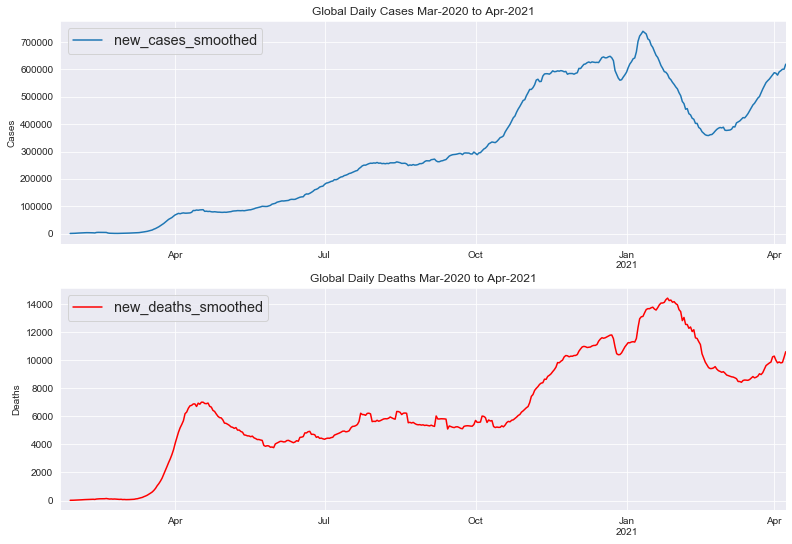

In [14]:
fig, ax = plt.subplots(2,1,figsize=(13,9))
for x, y in enumerate([df_world.new_cases_smoothed]):
    y.plot(ax=ax[0], linestyle='-')
for x, y in enumerate([df_world.new_deaths_smoothed]):
    y.plot(ax=ax[1], linestyle='-', color='r')
    
ax[0].legend(fontsize='x-large')
ax[0].set(xlabel = '', ylabel='Cases', title = 'Global Daily Cases Mar-2020 to Apr-2021')
ax[1].legend(fontsize='x-large')
ax[1].set(xlabel = '', ylabel='Deaths', title = 'Global Daily Deaths Mar-2020 to Apr-2021')

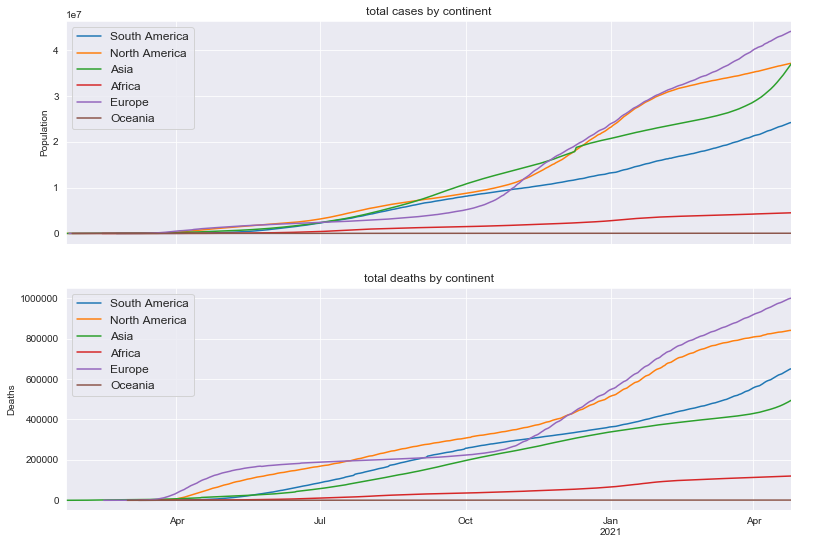

In [54]:
fig, ax = plt.subplots(2, 1, figsize=(13,9), sharex=True)
continents = ['South America','North America','Asia','Africa','Europe','Oceania']#No Antarctica information available

for i in continents:
    for x, y in enumerate([df[df.location==i].total_cases]):
        y.plot(ax=ax[0], linestyle='-')
ax[0].set(xlabel = '', ylabel='Population', title = 'total cases by continent')  
ax[0].annotate('Africa', xy=(df.index.max(),4000000), fontsize=12)
ax[0].legend(continents, fontsize='large')


for i in continents:
    for x, y in enumerate([df[df.location==i].total_deaths]):
        y.plot(ax=ax[1], linestyle='-')
ax[1].set(xlabel = '', ylabel='Deaths', title = 'total deaths by continent') 
ax[1].annotate('Africa', xy=(df.index.max(),110000), fontsize=12)
ax[1].legend(continents, loc='upper left',fontsize= 'large')

In [28]:
odf_canada = df[df.location=='Canada']

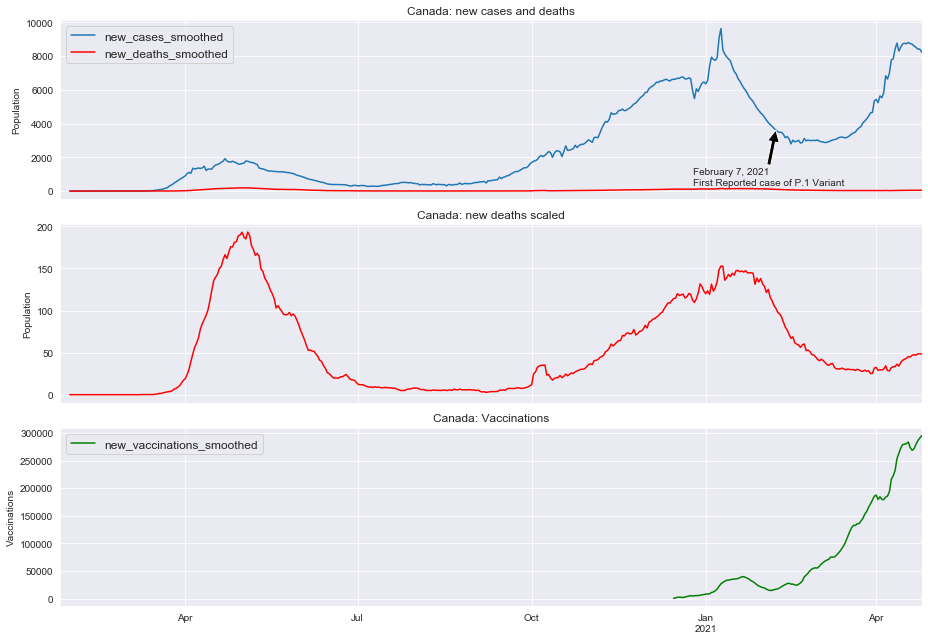

In [29]:
fig, ax = plt.subplots(3, 1, figsize=(13,9), sharex=True)
for x, y in enumerate([odf_canada.new_cases_smoothed]):
    y.plot(ax=ax[0], linestyle='-')
for x, y in enumerate([odf_canada.new_deaths_smoothed]):
    y.plot(ax=ax[0], linestyle='-', color='r')
for x, y in enumerate([odf_canada.new_deaths_smoothed]):
    y.plot(ax=ax[1], linestyle='-', color='r')
for x, y in enumerate([odf_canada.new_vaccinations_smoothed]):
    y.plot(ax=ax[2], linestyle='-', color='g')  

ax[0].set(xlabel = '', ylabel='Population', title = 'Canada: new cases and deaths')
ax[1].set(xlabel = '', ylabel='Population', title = 'Canada: new deaths scaled')
ax[2].set(xlabel = '', ylabel='Vaccinations', title = 'Canada: Vaccinations')

ax[0].legend(loc='upper left', fontsize='large')
ax[2].legend(loc='upper left', fontsize='large')
ax[0].annotate('February 7, 2021\nFirst Reported case of P.1 Variant',
               xy=('2021-02-07', odf_canada.new_cases_smoothed['2021-02-07']),
               xycoords = 'data', xytext=('2020-12-25',1400),
               arrowprops=dict(facecolor='black'),
               horizontalalignment='left',
               verticalalignment='top')

plt.tight_layout()

## Vaccinations vs Deaths
- it is difficult to see a clear trend because the world only had access to vaccines fairly recently
- the effects of large scale vaccinations will take a longer time-frame to visualize a clear effect

In [55]:
def timeplot(loc, case1, case2):
    fig, ax = plt.subplots(figsize=(14,7))
    for x, y in enumerate([df[df.location==loc][case1]]):
        y.plot(ax=ax, linestyle='-')
    for x, y in enumerate([df[df.location==loc][case2]]):
        y.plot(ax=ax, linestyle='-', color = 'r')
    #for x, y in enumerate([odf_canada.total_tests]):
    #    y.plot(ax=ax, linestyle='-')
    #for x, y in enumerate([odf_canada.total_vaccinations]):
    #    y.plot(ax=ax, linestyle='-')

    ax.set_title(''+case1+' vs '+case2, fontsize='xx-large')
    ax.legend(loc = 'upper left', fontsize='x-large')

In [56]:
def vtplot(case='Canada'):
    
    fig, host = plt.subplots(figsize=(12,6))
    par1 = host.twinx()
    par1.set_ylim(auto=True)

    host.set_ylabel('Total cases and vaccinations', fontsize=14)
    par1.set_ylabel('Total deaths', fontsize=14)

    for x, y in enumerate([df[df.location==case].total_cases.dropna()]):
        y.plot(ax=host, linestyle='-')
    for x, y in enumerate([df[df.location==case].total_deaths.dropna()]):
        y.plot(ax=par1, linestyle='--', color = 'r')
    for x, y in enumerate([df[df.location==case].total_vaccinations.dropna()]):
        y.plot(ax=host, linestyle='-', color='g')
    host.legend(labels=['total_cases','total_vaccinations'], loc='upper left', fontsize='x-large')
    par1.legend(labels=['total_deaths'], loc='upper right', fontsize='x-large')

    host.set_title(case, fontsize='xx-large')

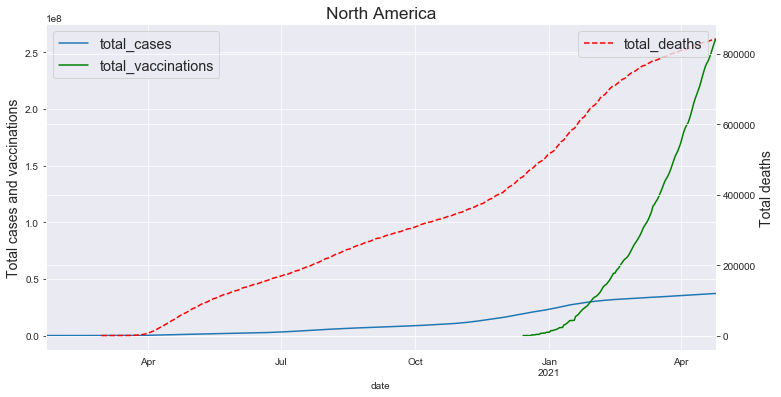

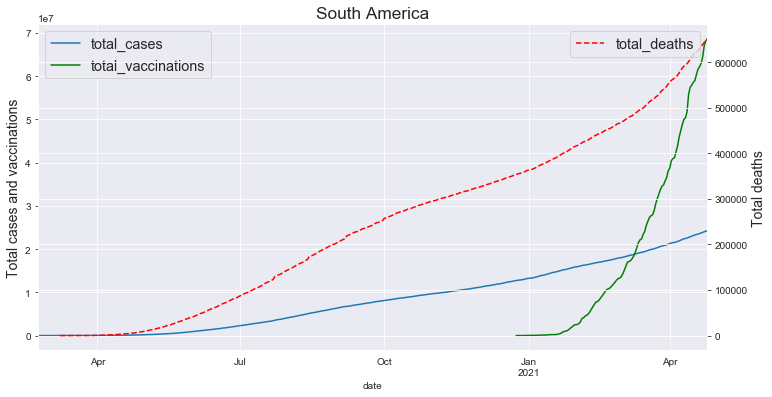

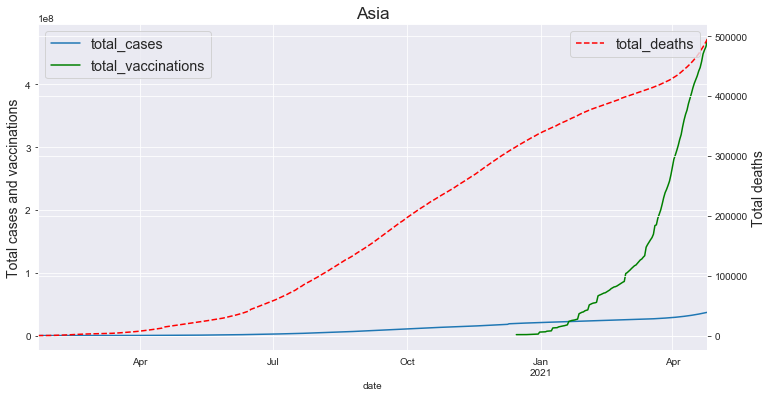

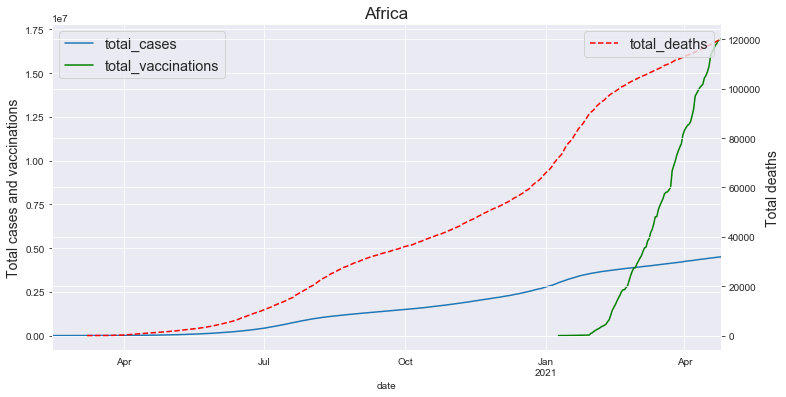

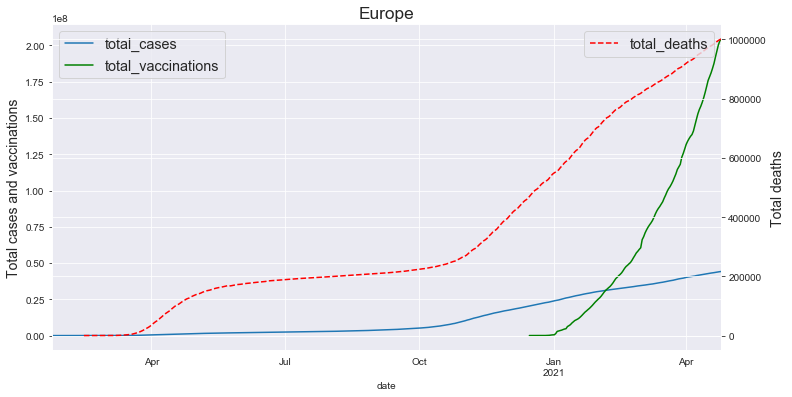

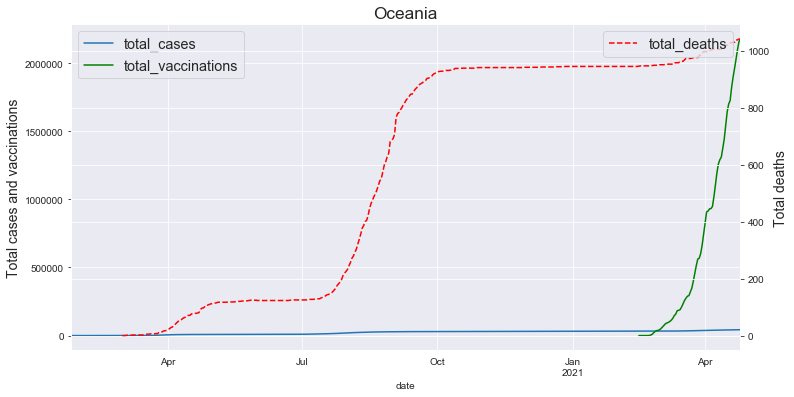

In [57]:
vtplot('North America')
vtplot('South America')
vtplot('Asia')
vtplot('Africa')
vtplot('Europe')
vtplot('Oceania')

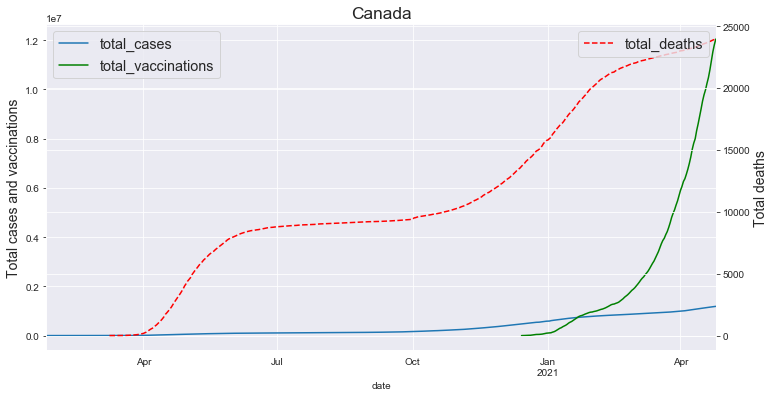

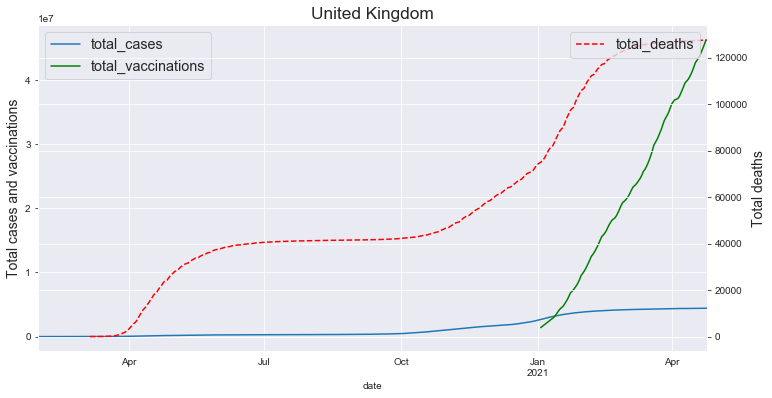

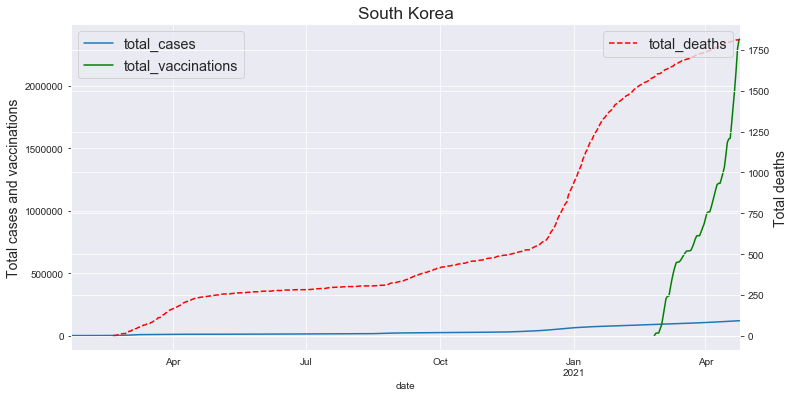

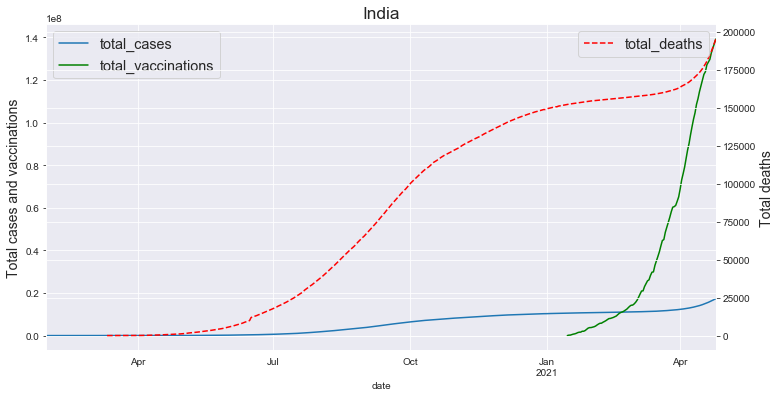

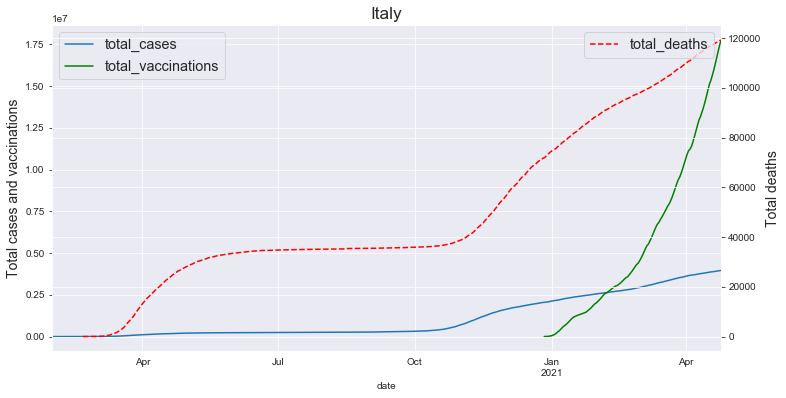

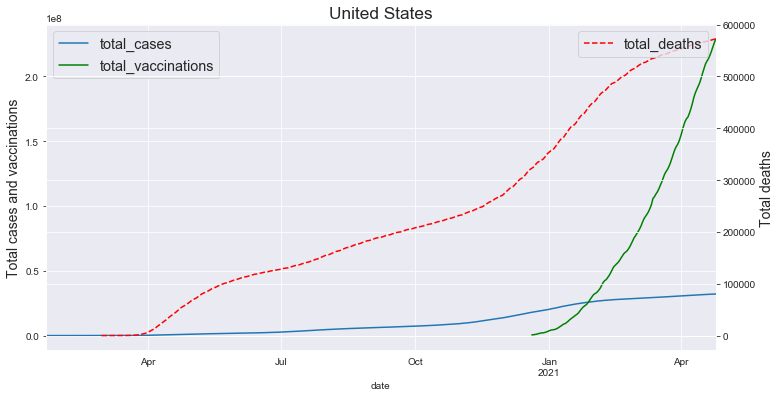

In [58]:
vtplot('Canada')
vtplot('United Kingdom')
vtplot('South Korea')
vtplot('India')
vtplot('Italy')
vtplot('United States')

## Chloropleth visualizations

In [60]:
odf_nocontinent = df[-df.location.isin(['World','European Union','North America',
                                        'South America','Asia','Africa','Europe','Oceania'])] # Removing Continents
#only take the max of each grouping
odf_totalcases = odf_nocontinent.groupby(odf_nocontinent['location']).agg(['max'])
odf_totalcases.columns = odf_totalcases.columns.droplevel(1)

## total_cases and total_deaths
- target variables for our visual analysis
    - note that total_deaths and cases _per million will also be taken into account
- the top 3 countries have very wide variance

In [61]:
fig = px.choropleth(odf_totalcases, locations='iso_code',
                    color='total_cases',
                    hover_name=odf_totalcases.index, 
                    color_continuous_scale=px.colors.sequential.deep)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

## total_deaths 
- similar to total_cases

In [62]:
fig = px.choropleth(odf_totalcases, locations='iso_code',
                    color='total_deaths',
                    hover_name=odf_totalcases.index, 
                    hover_data=['population_density','stringency_index','human_development_index'],
                    color_continuous_scale=px.colors.sequential.deep)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

## Life expectancy

In [63]:
fig = px.choropleth(odf_totalcases, locations='iso_code',
                    color=odf_totalcases.life_expectancy,
                    hover_name=odf_totalcases.index, 
                    color_continuous_scale=px.colors.diverging.curl,
                    color_continuous_midpoint=20)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

## Median Age
- note: aged_65_older and aged_70_older columns were removed as they correlated and redundant with median age
- median age is an important factor in determining how fatal the virus will be on populations
- generally, populations with higher median age are at risk for a higher crude mortality, ie. Italy, Spain, Portugal
- however, countries like Japan, even while having one of the highest median ages do not have the total deaths some other countries have at lower median ages (this is explored further)

In [64]:
fig = px.choropleth(odf_totalcases, locations='iso_code',
                    color=odf_totalcases.median_age,
                    hover_name=odf_totalcases.index, 
                    color_continuous_scale=px.colors.diverging.curl,
                    color_continuous_midpoint=20)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

In [65]:
odf_ma40 = odf[odf.median_age>40]
odf_ma20 = odf[odf.median_age<20]

top5_ma = odf_totalcases.sort_values(by='median_age', ascending=False).head(5).index.tolist()
bot5_ma = odf_totalcases.sort_values(by='median_age', ascending=True).head(5).index.tolist()

NameError: name 'odf' is not defined

In [ ]:
fig, ax = plt.subplots(2,1,figsize=(12,8), sharex=True)

for i in top5_ma:
    for x, y in enumerate([odf[odf.location==i].total_cases_per_million]):
        y.plot(ax=ax[0], linestyle='-')
for i in bot5_ma:
    for x, y in enumerate([odf[odf.location==i].total_cases_per_million]):
        y.plot(ax=ax[0], linestyle='dotted')
        
for i in top5_ma:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[1], linestyle='-')
for i in bot5_ma:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[1], linestyle='dotted')

ax[0].set(xlabel = '', ylabel='Population', title='Total Cases per million')
#ax[0].set_title('Total Cases per million',fontsize=20)
ax[0].legend(top5_ma+bot5_ma, fontsize='large')
ax[1].set(xlabel = '', ylabel='Population', title='Total Deaths per million')  
#ax[1].set_title('Total Deaths per million',fontsize=20)
fig.suptitle('Top 5 and Bottom 5 in Median Age', fontsize=15)



- Even though japan has the highest median age, they are among the lowest deaths in their population cohort 

## Stringency Index
- composite index measuring how strict a region is with lockdowns
- takes into account stay-at-home-orders, public, private closures and travel bans

In [66]:
zf = pd.DataFrame(df.groupby(by=['iso_code', 'location']).agg(['mean']))
zf.reset_index(inplace=True)
zf.columns = zf.columns.droplevel(1)

In [67]:
fig = px.choropleth(odf_totalcases, locations='iso_code',
                    color='stringency_index',
                    hover_name=odf_totalcases.index, 
                    color_continuous_scale=px.colors.sequential.deep,
                    title='Maximum Stringency')
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

In [40]:
fig = px.choropleth(zf, locations='iso_code',
                    color='stringency_index',
                    hover_name='location', 
                    color_continuous_scale=px.colors.sequential.deep)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

In [ ]:
top5_si = zf.sort_values(by='stringency_index', ascending=False).head(10).location.tolist()
bot5_si = zf.sort_values(by='stringency_index', ascending=True).head(10).location.tolist()

In [ ]:
top5_si

In [ ]:
fig, ax = plt.subplots(2,1,figsize=(14,10), sharex=True)

for i in top5_si:
    for x, y in enumerate([odf[odf.location==i].total_cases_per_million]):
        y.plot(ax=ax[0], linestyle='-')
for i in bot5_si:
    for x, y in enumerate([odf[odf.location==i].total_cases_per_million]):
        y.plot(ax=ax[0], linestyle='--')
        
for i in top5_si:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[1], linestyle='-')
        #ax[1].annotate(i, xy=(odf.index.max(), odf[odf.location==i].total_deaths_per_million.max()))
for i in bot5_si:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[1], linestyle='--')
        #ax[1].annotate(i, xy=(odf.index.max(), odf[odf.location==i].total_deaths_per_million.max()))

ax[0].set(xlabel = '', ylabel='Cases', title='Total Cases per million')
#ax[0].set_title('Total Cases per million',fontsize=20)
ax[0].legend(top5_si+bot5_si, fontsize='medium')
ax[1].set(xlabel = '', ylabel='Deaths', title='Total Deaths per million')  
#ax[1].set_title('Total Deaths per million',fontsize=20)
fig.suptitle('Top 10 (solid lines) and Bottom 10 (dashed) in Stringency Index', fontsize=15)

- There does not seem to be a positive correlation between higher stringency and lower cases/deaths
- It is important to note stringency is a measure of the government actions taken
- there must be other more impactful variables

In [ ]:
list_pd = odf_totalcases.sort_values('population_density', ascending=False).head(5).index.tolist()

In [ ]:
odf2 = odf_totalcases.copy()
odf2.drop(labels=list_pd, axis=0, inplace=True)

In [ ]:
zf.sort_values(by='stringency_index', ascending=False).head(10)[['location','stringency_index','total_deaths_per_million','total_cases_per_million']]

In [ ]:
zf.sort_values(by='stringency_index', ascending=True).head(10)[['location','stringency_index','total_deaths_per_million','total_cases_per_million']].dropna()

In [ ]:
fig = px.choropleth(odf2, locations='iso_code',
                    color='population_density',
                    hover_name=odf2.index, 
                    color_continuous_scale=px.colors.sequential.deep)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

## Hospital beds per thousand
- may act as a mitigator for COVID19 deaths in larger populations

In [68]:
hbdf = odf_totalcases.sort_values(by='hospital_beds_per_thousand', ascending=False)[['hospital_beds_per_thousand',
                                                                                     'total_deaths_per_million',
                                                                                     'median_age','population',
                                                                                     'population_density']].dropna()
hbdf.reset_index(inplace=True)
hbdf.head(15)

- There seems to be some correlation of deaths per million to hospital beds, but the median age may affect deaths more strongly

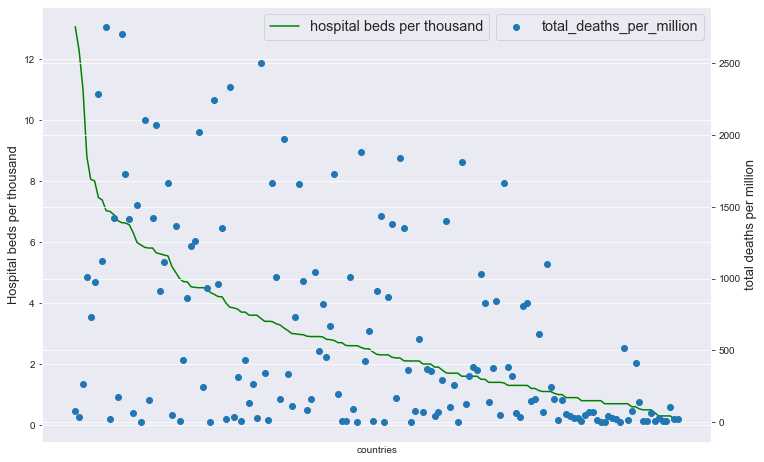

In [71]:
fig, host = plt.subplots(figsize=(12,8))
par1 = host.twinx()

host.set_xlim(auto=True)
host.set_xticks([])
host.set_ylim(auto=True)
par1.set_ylim(auto=True)

host.set_xlabel('countries')
host.set_ylabel('Hospital beds per thousand', fontsize=13)
par1.set_ylabel('total deaths per million', fontsize=13)
p1 = host.plot(np.array(hbdf.hospital_beds_per_thousand.values), color='g')
p2 = par1.scatter(x=np.arange(0,len(hbdf)),y=np.array(hbdf.total_deaths_per_million.values))
host.legend(labels=['hospital beds per thousand'], loc='upper center', fontsize='x-large')
par1.legend(labels=['total_deaths_per_million'], loc='upper right', fontsize='x-large')


In [72]:
mdf = hbdf[hbdf.median_age>42]

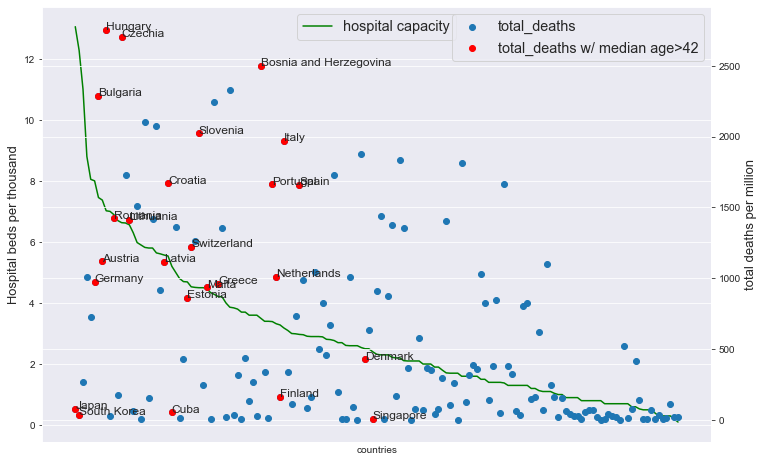

In [73]:
fig, host = plt.subplots(figsize=(12,8))
par1 = host.twinx()

host.set_xlim(auto=True)
host.set_xticks([])
host.set_ylim(auto=True)
par1.set_ylim(auto=True)

host.set_xlabel('countries')
host.set_ylabel('Hospital beds per thousand', fontsize=13)
par1.set_ylabel('total deaths per million', fontsize=13)
p1 = host.plot(np.array(hbdf.hospital_beds_per_thousand.values), color='g')
p2 = par1.scatter(x=np.arange(0,len(hbdf)),y=np.array(hbdf.total_deaths_per_million.values))
p22 = par1.scatter(x=np.array(mdf.index.tolist()), y=np.array(mdf.total_deaths_per_million.values), color='r')
host.legend(labels=['hospital capacity'], loc='upper center', fontsize='x-large')
par1.legend(labels=['total_deaths','total_deaths w/ median age>42'], loc='upper right', fontsize='x-large')

for i in range(mdf.shape[0]):
    plt.annotate(mdf.location.tolist()[i], (mdf.index.tolist()[i], mdf.total_deaths_per_million.tolist()[i]),fontsize=12)

- Counterintuitively, the trend shows that less hospital capacity is correlated somewhat to a lower total death count
- It may be that beds are most effective after some threshold value. 
    - ie. all countries above 8 beds/thousand have very good COVID19 outcomes, within the same population cohort
- median age and hospital beds per thousand are moderately positively correlated with a pearson coefficient of 0.66
 

In [74]:
fsdf = odf_totalcases.sort_values(by='female_smokers', ascending=False)[['hospital_beds_per_thousand',
                                                                         'total_deaths_per_million',
                                                                         'male_smokers',
                                                                         'female_smokers',
                                                                         'median_age']].dropna()
fsdf.reset_index(inplace=True)

In [76]:
mddf = fsdf[fsdf.median_age>42]

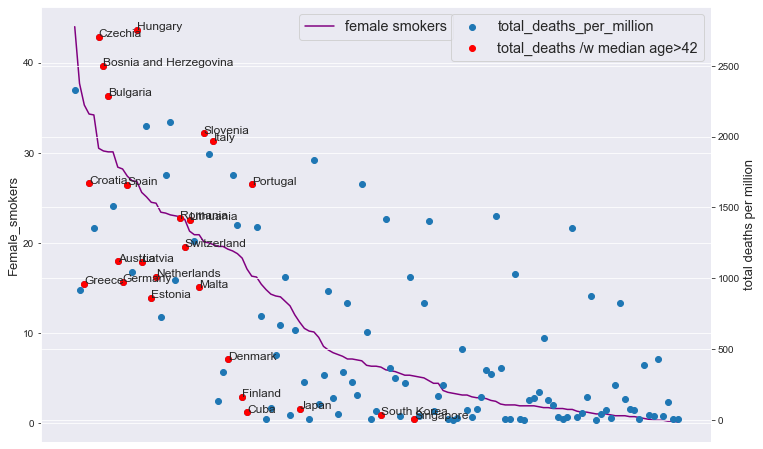

In [77]:
fig, host = plt.subplots(figsize=(12,8))
par1 = host.twinx()

host.set_xlim(auto=True)
host.set_xticks([])
host.set_ylim(auto=True)
par1.set_ylim(auto=True)

host.set_ylabel('Female_smokers', fontsize=13)
par1.set_ylabel('total deaths per million', fontsize=13)
p1 = host.plot(np.array(fsdf.female_smokers.values), color='purple')
p2 = par1.scatter(x=np.arange(0,len(fsdf)),y=np.array(fsdf.total_deaths_per_million.values))
p22 = par1.scatter(x=np.array(mddf.index.tolist()), y=np.array(mddf.total_deaths_per_million.values), color='r')
host.legend(labels=['female smokers'], loc='upper center', fontsize='x-large')
par1.legend(labels=['total_deaths_per_million', 'total_deaths /w median age>42'], loc='upper right', fontsize='x-large')


for i in range(mddf.shape[0]):
    plt.annotate(mddf.location.tolist()[i], (mddf.index.tolist()[i], mddf.total_deaths_per_million.tolist()[i]),fontsize=12)


- female smoker correlation is very strong
- pearson correlation femalesmokers vs total_deaths_per_million = 0.69 which is a strong positive correlation


In [78]:
fsdf.corr(method='pearson')

,hospital_beds_per_thousand,total_deaths_per_million,male_smokers,female_smokers,median_age
hospital_beds_per_thousand,1.000000,0.354110,0.379599,0.491281,0.660043
total_deaths_per_million,0.354110,1.000000,0.101070,0.703851,0.587428
male_smokers,0.379599,0.101070,1.000000,0.216911,0.252351
female_smokers,0.491281,0.703851,0.216911,1.000000,0.692822
median_age,0.660043,0.587428,0.252351,0.692822,1.000000


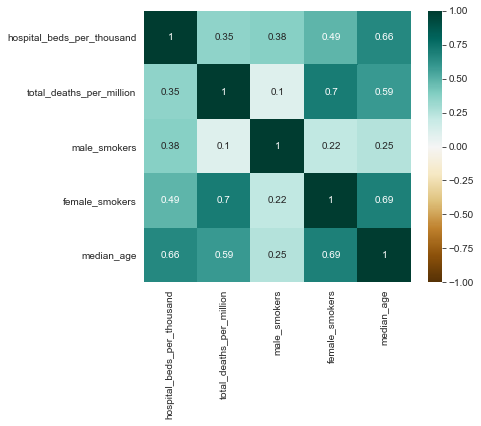

In [79]:
plt.figure(figsize=(6,5))
sns.heatmap(fsdf.corr(method='pearson'), vmin=-1, vmax=1, annot=True, cmap='BrBG')

In [80]:
msdf = odf_totalcases.sort_values(by='male_smokers', ascending=False)[['hospital_beds_per_thousand',
                                                                       'total_deaths_per_million',
                                                                       'male_smokers',
                                                                       'female_smokers',
                                                                       'gdp_per_capita',
                                                                       'median_age']].dropna()
msdf.reset_index(inplace=True)

In [82]:
mmdf = msdf[msdf.median_age>42]

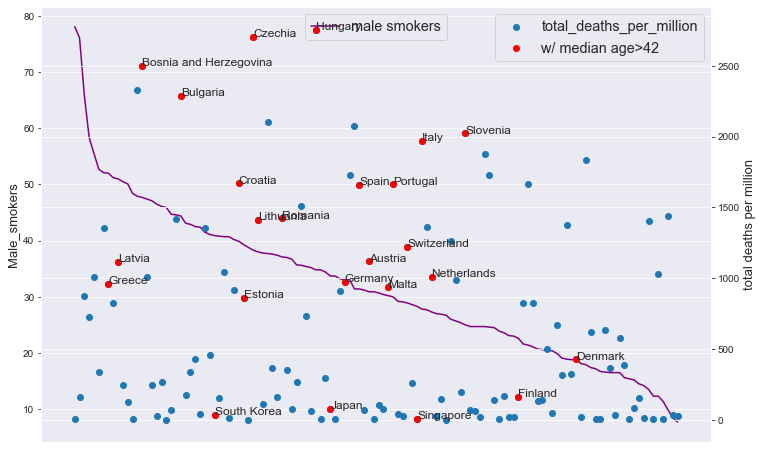

In [83]:
fig, host = plt.subplots(figsize=(12,8))
par1 = host.twinx()

host.set_xlim(auto=True)
host.set_xticks([])
host.set_ylim(auto=True)
par1.set_ylim(auto=True)

host.set_ylabel('Male_smokers', fontsize=13)
par1.set_ylabel('total deaths per million', fontsize=13)
p1 = host.plot(np.array(msdf.male_smokers.values), color='purple')
p2 = par1.scatter(x=np.arange(0,len(msdf)),y=np.array(msdf.total_deaths_per_million.values))
p22 = par1.scatter(x=np.array(mmdf.index.tolist()), y=np.array(mmdf.total_deaths_per_million.values), color='r')
host.legend(labels=['male smokers'], loc='upper center', fontsize='x-large')
par1.legend(labels=['total_deaths_per_million', 'w/ median age>42'], loc='upper right', fontsize='x-large')

for i in range(mmdf.shape[0]):
    plt.annotate(mmdf.location.tolist()[i], (mmdf.index.tolist()[i], mmdf.total_deaths_per_million.tolist()[i]),fontsize=12)

In [84]:
fig = px.choropleth(odf_totalcases, locations='iso_code',
                    color='hospital_beds_per_thousand',
                    hover_name=odf_totalcases.index, 
                    color_continuous_scale=px.colors.sequential.deep)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

In [86]:
pd.set_option('display.float_format', '{:.2f}'.format)
hbpt = odf_totalcases[odf_totalcases.population.between(100000000,200000000)][['total_deaths_per_million','total_cases_per_million','population','population_density','hospital_beds_per_thousand']].sort_values(by='total_deaths_per_million')

In [87]:
hbpt.sort_values(by='hospital_beds_per_thousand', ascending=False)

,total_deaths_per_million,total_cases_per_million,population,population_density,hospital_beds_per_thousand
location,,,,,
Japan,78.58,4495.86,126476458.00,347.78,13.05
Russia,729.33,32265.44,145934460.00,8.82,8.05
Egypt,127.51,2174.47,102334403.00,98.00,1.60
Mexico,1667.12,18058.96,128932753.00,66.44,1.38
Philippines,153.16,9103.06,109581085.00,351.87,1.00
Bangladesh,67.11,4525.62,164689383.00,1265.04,0.80
Ethiopia,30.89,2194.43,114963583.00,104.96,0.30


In [88]:
odf_hb7 = odf[odf.hospital_beds_per_thousand>6]
odf_hb6 = odf[odf.hospital_beds_per_thousand<6]

top5_hbpt = odf_totalcases.sort_values(by='hospital_beds_per_thousand', ascending=False).head(5).index.tolist()
bot5_hbpt = odf_totalcases.sort_values(by='hospital_beds_per_thousand', ascending=True).head(5).index.tolist()

NameError: name 'odf' is not defined

In [ ]:
bot5_hbpt

In [ ]:
fig, ax = plt.subplots(2,1, figsize=(12,8), sharex=True)

for i in top5_hbpt:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[0], linestyle='-')
for i in bot5_hbpt:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[0], linestyle='dotted')

for i in top5_hbpt:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[1], linestyle='-')
for i in bot5_hbpt:
    for x, y in enumerate([odf[odf.location==i].total_deaths_per_million]):
        y.plot(ax=ax[1], linestyle='dotted')

ax[0].set(xlabel = '', ylabel='Population', title = 'Total cases per million')  
ax[0].legend(top5_hbpt+bot5_hbpt, fontsize='large')
ax[1].set(xlabel = '', ylabel='Population', title = 'Total deaths per million')  



In [ ]:
fig = px.choropleth(odf_totalcases, locations='iso_code',
                    color='extreme_poverty',
                    hover_name=odf_totalcases.index, 
                    color_continuous_scale=px.colors.sequential.deep)
fig.update_geos(fitbounds='locations', visible=False)
fig.show()

# Correlations

In [89]:
#Removing redundant columns
#some columns are removed due to multicollinearity
OWIDdf = OWIDdf.drop(columns=['aged_65_older','aged_70_older','iso_code','continent'])

In [90]:
odft=odf_totalcases.copy()
list_ts = [col for col in odft.columns if 'new' in col or 'total' in col or 'people' in col]
odft = odft.drop(columns=['aged_65_older','aged_70_older','iso_code','continent','reproduction_rate','positive_rate','tests_per_case']+list_ts)

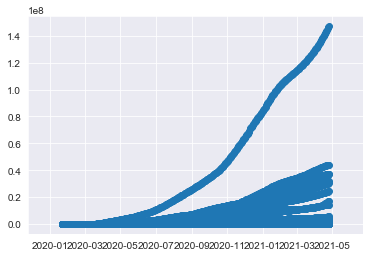

In [91]:
plt.scatter(df.total_cases.index, df.total_cases)

In [92]:
odft.describe()

,icu_patients,icu_patients_per_million,hosp_patients,hosp_patients_per_million,weekly_icu_admissions,weekly_icu_admissions_per_million,weekly_hosp_admissions,weekly_hosp_admissions_per_million,stringency_index,population,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
count,24.00,24.00,29.00,29.00,16.00,16.00,23.00,23.00,179.00,209.00,...,189.00,124.00,187.00,194.00,144.00,142.00,94.00,168.00,206.00,186.00
mean,2831.75,75.43,13422.90,547.64,817.27,60.83,13435.48,435.84,82.91,37122192.34,...,19238.10,13.96,262.56,8.10,10.67,32.79,50.17,3.01,73.28,0.72
std,6129.02,38.25,25756.34,346.63,1280.54,66.53,25979.66,553.82,15.62,142833914.15,...,20596.92,20.31,121.07,4.39,10.72,13.56,32.04,2.44,7.62,0.15
min,14.00,14.98,80.00,56.49,0.94,2.75,49.67,53.66,23.15,809.00,...,661.24,0.10,79.37,0.99,0.10,7.70,1.19,0.10,53.28,0.39
25%,194.25,47.58,1155.00,297.55,64.20,27.79,831.92,184.37,78.47,988002.00,...,4227.63,0.60,170.67,5.31,1.90,21.85,19.73,1.30,67.92,0.60
50%,858.50,73.65,3284.00,555.58,150.02,42.99,2361.09,296.89,87.04,6948445.00,...,12236.71,2.35,243.96,7.15,6.25,32.25,48.75,2.40,74.58,0.74
75%,2565.00,93.53,10649.00,684.91,850.19,61.51,16489.48,417.39,93.52,26378275.00,...,27216.44,21.67,332.43,10.42,19.15,41.25,82.04,3.90,78.88,0.84
max,30028.00,192.74,129800.00,1532.57,4037.02,279.04,116374.00,2656.91,100.00,1439323774.00,...,116935.60,77.60,724.42,30.53,44.00,78.10,99.00,13.80,86.75,0.96


In [843]:
odft.corr()

,stringency_index,population,population_density,median_age,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index,crude_mortality
stringency_index,1.000000,0.057438,-0.208643,0.006243,-0.129961,-0.264952,0.032822,0.105290,-0.056695,0.082662,0.420384,-0.077334,0.008447,0.088564,0.121181
population,0.057438,1.000000,-0.028982,0.036058,-0.052685,-0.039960,-0.004860,0.029992,-0.119315,0.028076,0.039389,-0.036832,-0.020030,-0.015316,-0.064045
population_density,-0.208643,-0.028982,1.000000,0.149113,0.409232,-0.029067,-0.175718,0.020060,-0.062020,0.000418,0.102984,0.315258,0.235196,0.180556,-0.000176
median_age,0.006243,0.036058,0.149113,1.000000,0.639389,-0.697290,-0.340101,0.155542,0.671911,0.198093,0.785879,0.663296,0.846447,0.899684,0.605296
gdp_per_capita,-0.129961,-0.052685,0.409232,0.639389,1.000000,-0.507000,-0.476683,0.182956,0.352421,-0.088163,0.647415,0.299505,0.680991,0.755712,0.312048
extreme_poverty,-0.264952,-0.039960,-0.029067,-0.697290,-0.507000,1.000000,0.189471,-0.401898,-0.411692,-0.192223,-0.751043,-0.443556,-0.752270,-0.777256,-0.463878
cardiovasc_death_rate,0.032822,-0.004860,-0.175718,-0.340101,-0.476683,0.189471,1.000000,0.130928,-0.171931,0.417471,-0.039956,0.015024,-0.466589,-0.425665,-0.208352
diabetes_prevalence,0.105290,0.029992,0.020060,0.155542,0.182956,-0.401898,0.130928,1.000000,-0.054708,0.169587,0.473175,-0.073993,0.258217,0.214335,-0.020385
female_smokers,-0.056695,-0.119315,-0.062020,0.671911,0.352421,-0.411692,-0.171931,-0.054708,1.000000,0.201530,0.296452,0.496561,0.524161,0.582708,0.683591
male_smokers,0.082662,0.028076,0.000418,0.198093,-0.088163,-0.192223,0.417471,0.169587,0.201530,1.000000,0.326753,0.368212,0.070327,0.105738,0.070225


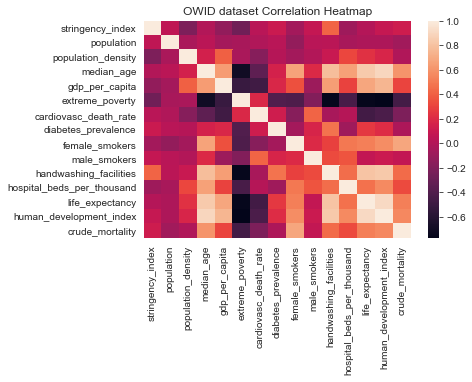

In [844]:
save = sns.heatmap(odft.corr()).set_title('OWID dataset Correlation Heatmap')

#save.figure.savefig('heatmap.png')

Text(0.5, 1, 'Features correlating with total_cases')

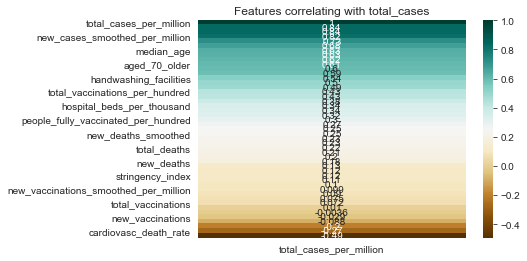

In [845]:
sns.heatmap(odf_totalcases.corr()[['total_cases_per_million']].sort_values(by='total_cases_per_million', ascending=False),
            annot=True, cmap='BrBG').set_title('Features correlating with total_cases')

Text(0.5, 1, 'Features correlating with total_deaths')

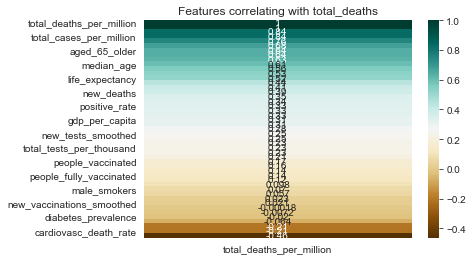

In [846]:
dhmp = sns.heatmap(odf_totalcases.corr()[['total_deaths_per_million']].sort_values(by='total_deaths_per_million', ascending=False), annot=True, cmap='BrBG')
dhmp.set_title('Features correlating with total_deaths')

In [ ]:
nowiddfn = odf.select_dtypes(include='float64')
#ppdf = sns.pairplot(nowiddfn.sample(1000))
#ppdf.savefig("pairplotowid.png")

Some of the target variables to consider: reproduction_rate, total_cases_per_million, total_deaths_per_million.
Normally we would also consider crude mortality rate or case-fatality rate as well. However, confirmed cases is often underreported AND undertested and as such may be harder to evaluate accurately. It is important to consider that the data being robust and accurate relies heavily on the nation's testing capacity. 

Remember that the reproduction rate (R) describes the trajectory of the virus. A value of R = 1 means the amount of new infections and new recoveries are equal; meaning the virus numbers will stagnate. A value of 6.74 means the number of infected is sharply increasing and may lead in a big spike of infections and deaths, depending on government mitigation strategy.

In [847]:
print(OWIDdf.reproduction_rate.max())
odf[odf.reproduction_rate==OWIDdf.reproduction_rate.max()]

5.71


,iso_code,continent,location,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
date,,,,,,,,,,,,,,,,,,,,,
2020-02-21,KOR,Asia,South Korea,204.0,100.0,25.143,2.0,1.0,0.286,3.979,...,35938.374,0.2,85.998,6.8,6.2,40.9,NaN,12.27,83.03,0.916


# Bubble Visualizations

In [882]:
odf1 = df.groupby(df['location']).agg(['max'])
odf1.columns = odf1.columns.droplevel(1)
odf1.reset_index(level=0, inplace=True)

In [884]:
odf1 = odf1[odf1.population.notna()]

odf1 = odf1[odf1.total_cases.notna()]

odf1 = odf1[odf1.population_density.notna()]

odf1 = odf1[odf1.human_development_index.notna()]

odf1 = odf1[odf1.gdp_per_capita.notna()]

odf1 = odf1[odf1.total_deaths_per_million.notna()]

odf1 = odf1[odf1.life_expectancy.notna()]

In [856]:
odf1 = odf1[-odf1.location.isin(['World','European Union','North America','South America','Asia','Africa','Europe','Oceania'])]

In [885]:
odfpx = odf1.sort_values(by='population_density', ascending=False).head(10)

In [925]:
px.scatter(odf1, x='life_expectancy',y='human_development_index', size='gdp_per_capita',
           color ='continent', hover_name='location',
           title='HDI vs Life_expectancy vs gdp_per_capita')

In [950]:
px.scatter(odf1, x='life_expectancy',y='human_development_index', size='total_deaths_per_million',
           color ='continent', hover_name='location',
           title='HDI vs Life_expectancy vs dpm')

In [951]:
px.scatter(odf1, x='life_expectancy',y='human_development_index', size='median_age',
           color ='continent', hover_name='location',
           title='HDI vs Life_expectancy vs dpm')

- Countries with lower life expectancy, HDI and GDP tend to fare better against COVID deaths
- Possible reason: GDP, HDI lead to better life expectancy, which leads to higher median age
    - effectively a larger proportion of population is at risk

In [929]:
px.scatter(odf1, x='life_expectancy',y='human_development_index', size='diabetes_prevalence',
           color ='continent', hover_name='location',
           title='HDI vs Life_expectancy vs diabetes')

In [930]:
px.scatter(odf1, x='life_expectancy',y='human_development_index', size='cardiovasc_death_rate',
           color ='continent', hover_name='location',
           title='HDI vs Life_expectancy vs cardiovasc')

In [931]:

px.scatter(odf1, x='cardiovasc_death_rate',y='diabetes_prevalence', size='total_deaths_per_million',
           color ='continent', hover_name='location',
           title='cardiovasc vs diabetes vs total_deaths_per_million')

In [889]:
px.scatter(odf1, x='male_smokers',y='female_smokers', size='total_deaths_per_million',
           color ='continent', hover_name='location',
           title='msmoke vs fsmoke vs total_deaths_per_million')

- very strong correlation between female smokers and total dpm

In [890]:
odf1 = odf1[odf1.median_age.notna()]

In [891]:
odf1.sort_values(by='population_density', ascending=False)[['location','population_density']]

,location,population_density
174,Singapore,7915.731
15,Bahrain,1935.907
120,Maldives,1454.433
122,Malta,1454.037
16,Bangladesh,1265.036
...,...,...
186,Suriname,3.612
88,Iceland,3.404
11,Australia,3.202
136,Namibia,3.078


In [934]:
px.scatter(odf1, x='population',y='population_density', size='total_cases_per_million',
           color ='continent', hover_name='location',
           title='population density and cpm')

In [893]:
odfdt_vis = odf1[odf1['handwashing_facilities'].notna()]

In [897]:
px.scatter(odfdt_vis,x='total_deaths_per_million',y='handwashing_facilities',
           color='continent', hover_data=['location'],
           title='Handwashing facilities and crude mortality')

The data shows that having more handwashing facilities doesn't necessarily indicate better COVID19 outcomes

In [904]:
px.scatter(odfdt_vis,x='total_deaths_per_million',y='median_age',
           color='location', hover_data=['location'],
           title='median age and dpm')

- Countries with higher median age are typically hit harder

# Data Mining experimenting

## Random Forest Regressor
- Feature importances help develop a feature profile for the strongest affectors of the pandemic

In [57]:
list_nocol = [col for col in df.columns if 'new' in col or 'per' in col or 'people' in col or 'aged' in col or 'units' in col]

## RF Importances 

In [116]:
def RFimportances(y, X):
    #Train test split
    train_X, val_X, train_y, val_y = train_test_split(X, y, random_state=1)
    
    #Imputing median in NA
    imp = SimpleImputer(missing_values=np.nan, strategy='median')
    imp = imp.fit(train_X)
    train_X = imp.transform(train_X)

    valimp = SimpleImputer(missing_values=np.nan, strategy='median')
    valimp = valimp.fit(val_X)
    val_X = valimp.transform(val_X)

    val_y = val_y.fillna(val_y.median())
    train_y = train_y.fillna(train_y.median())
    
    #Model fitting
    clf = RandomForestRegressor(n_estimators=100, bootstrap = True, random_state = 1)
    clf = clf.fit(train_X, train_y)
    
    #Model evaluation
    print("Model Evaluation:")
    print('R^2 training set: {:.2f} \nR^2 val set: {:.2f}'.format(clf.score(train_X, train_y),clf.score(val_X, val_y)))
    val_pred = clf.predict(val_X)
    val_mae = mean_absolute_error(val_pred, val_y)
    print("validation MAE: {:,.0f}\n".format(val_mae))

    
    #Feature Importances
    print("Feature Importances")
    importances = clf.feature_importances_
    std = np.std([tree.feature_importances_ for tree in clf.estimators_],axis=0)
    indices = np.argsort(importances)[::-1]

    for f in range (train_X.shape[1]):
        featurelist = []
        featurelist.append(X.columns[indices[f]])
        print(f"{X.columns.get_loc(X.columns[indices[f]])}\t"
              f"{X.columns[indices[f]]} "
              f"{importances[indices[f]]:.4f}")

    plt.figure(figsize=(12,8))
    plt.title("Feature importances")
    plt.bar(d, importances[indices],
            color="r", yerr=std[indices], align="center")
    plt.xticks(range(train_X.shape[1]), indices)
    plt.xlim([-1, train_X.shape[1]])
    plt.show()
    
    #Permutation importances
    print('Permutation Importances')
    a,b,c = [],[],[]
    r = permutation_importance(clf, val_X, val_y)
    for i in r.importances_mean.argsort()[::-1]:
        if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
            a.append(r.importances_mean[i])
            b.append(str(i+1))
            c.append(r.importances_std[i])
            print(f"{i+1} \t"
                  f"{X.columns[i]:<8} \t"
                  f"{r.importances_mean[i]:.3f}"
                  f" +/- {r.importances_std[i]:.3f}")

    plt.figure(figsize=(12,8))
    plt.title("Permutation importances")
    plt.bar(b, a, yerr=c, color="r", align="center")
    plt.xticks(b)
    plt.show()

## Target variable: total_deaths
- total deaths is a good target variable

In [112]:
y = df.total_deaths
X = df[df.columns.difference(list_nocol+['iso_code','location','continent','crude_mortality','total_deaths','positive_rate','population','total_cases','tests_units'])] 

Model Evaluation:
R^2 training set: 0.85 
R^2 val set: 0.74
validation MAE: 5,707

Feature Importances
13	total_vaccinations 0.6377
6	life_expectancy 0.1074
9	population_density 0.0929
12	total_tests 0.0576
11	stringency_index 0.0253
0	cardiovasc_death_rate 0.0213
2	extreme_poverty 0.0181
1	diabetes_prevalence 0.0108
5	human_development_index 0.0090
3	female_smokers 0.0069
7	male_smokers 0.0053
10	reproduction_rate 0.0049
8	median_age 0.0025
4	handwashing_facilities 0.0007


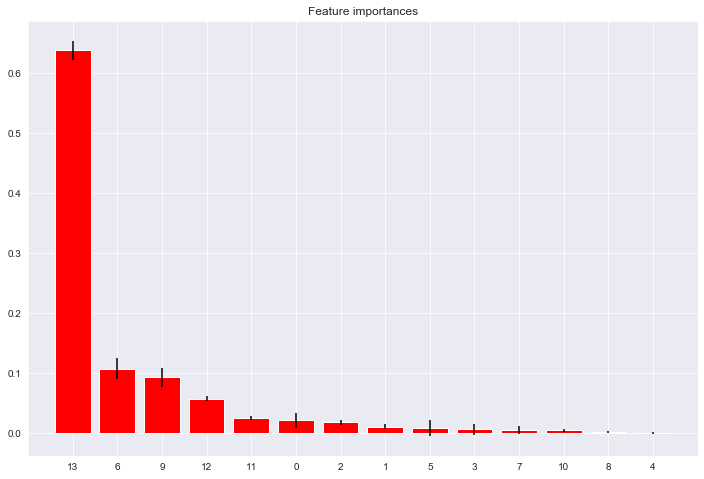

Permutation Importances
14 	total_vaccinations 	0.936 +/- 0.028
10 	population_density 	0.209 +/- 0.018
7 	life_expectancy 	0.181 +/- 0.008
13 	total_tests 	0.118 +/- 0.003
3 	extreme_poverty 	0.067 +/- 0.004
12 	stringency_index 	0.044 +/- 0.003
1 	cardiovasc_death_rate 	0.024 +/- 0.004
2 	diabetes_prevalence 	0.019 +/- 0.001
9 	median_age 	0.012 +/- 0.001
11 	reproduction_rate 	0.010 +/- 0.001
6 	human_development_index 	0.005 +/- 0.002
4 	female_smokers 	0.004 +/- 0.000
8 	male_smokers 	0.001 +/- 0.001
5 	handwashing_facilities 	0.001 +/- 0.000


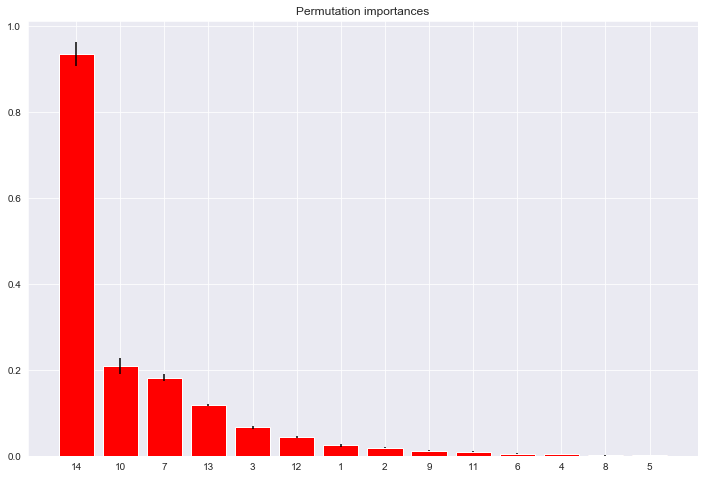

In [117]:
RFimportances(y, X)

## Target variable: total_deaths_per_million
- may be better target than simply total_deaths
- normalized for population differences
- population and total_deaths must be removed to prevent multicollinearity

In [128]:
y = df.total_deaths_per_million
X = df[df.columns.difference(list_nocol+['iso_code','location','continent','crude_mortality','total_deaths','positive_rate','population','total_cases','tests_units'])] 

Model Evaluation:
R^2 training set: 0.98 
R^2 val set: -3.31
validation MAE: 468

Feature Importances
13	total_vaccinations 0.2724
3	female_smokers 0.1199
12	total_tests 0.1049
11	stringency_index 0.0928
5	human_development_index 0.0757
6	life_expectancy 0.0621
9	population_density 0.0559
2	extreme_poverty 0.0505
10	reproduction_rate 0.0455
7	male_smokers 0.0398
0	cardiovasc_death_rate 0.0299
1	diabetes_prevalence 0.0240
8	median_age 0.0173
4	handwashing_facilities 0.0092


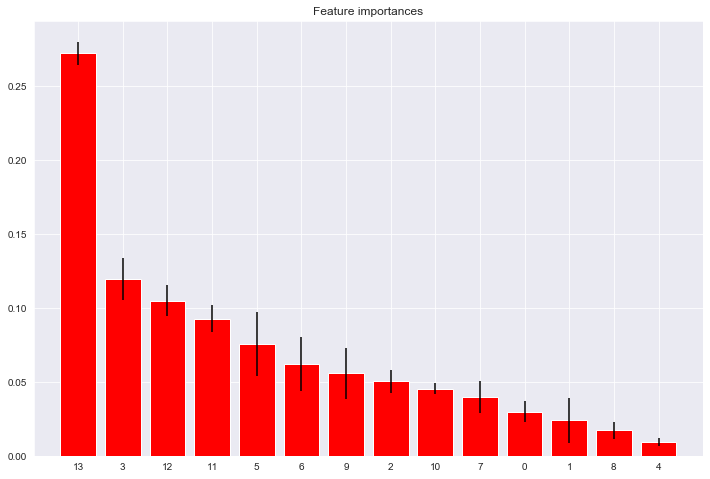

Permutation Importances
4 	female_smokers 	0.506 +/- 0.037
6 	human_development_index 	0.291 +/- 0.003
14 	total_vaccinations 	0.072 +/- 0.013
13 	total_tests 	0.029 +/- 0.000
7 	life_expectancy 	0.025 +/- 0.002
11 	reproduction_rate 	0.009 +/- 0.003


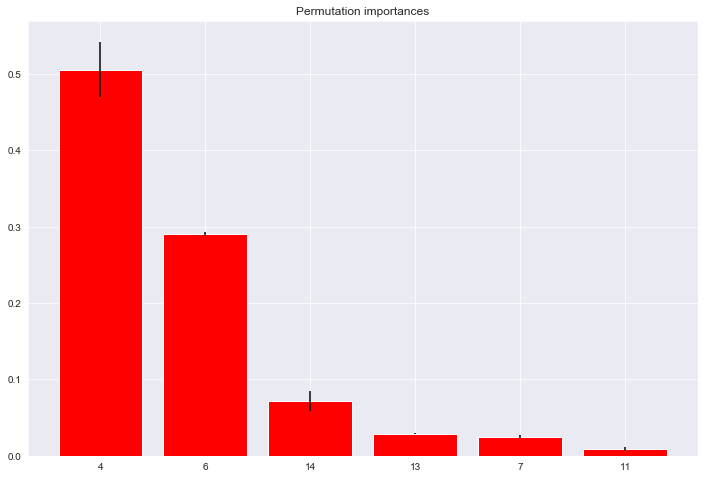

In [129]:
RFimportances(y, X)
#weak model

## Target variable: total_cases
- insight how the virus spread

In [130]:
y = df.total_cases
X = df[df.columns.difference(list_nocol+['iso_code','location','continent','crude_mortality','total_deaths','positive_rate','population','total_cases','tests_units'])] 

Model Evaluation:
R^2 training set: 0.89 
R^2 val set: 0.79
validation MAE: 192,535

Feature Importances
13	total_vaccinations 0.6767
9	population_density 0.1032
12	total_tests 0.0827
6	life_expectancy 0.0594
5	human_development_index 0.0252
0	cardiovasc_death_rate 0.0133
11	stringency_index 0.0128
7	male_smokers 0.0112
2	extreme_poverty 0.0073
10	reproduction_rate 0.0026
3	female_smokers 0.0019
8	median_age 0.0018
1	diabetes_prevalence 0.0017
4	handwashing_facilities 0.0003


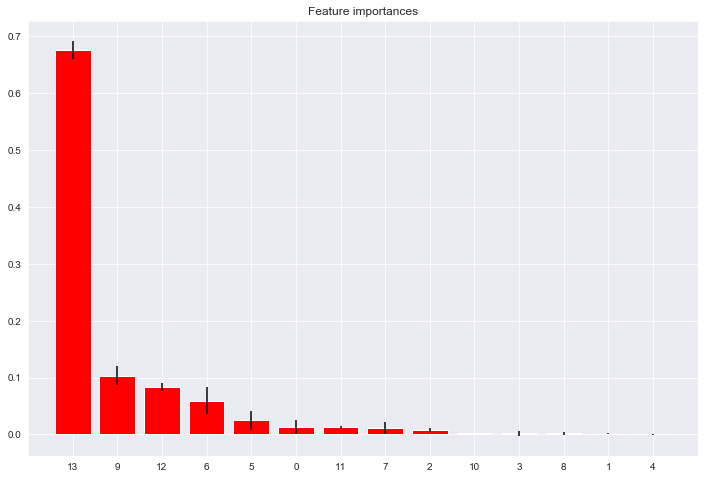

Permutation Importances
14 	total_vaccinations 	1.109 +/- 0.027
10 	population_density 	0.307 +/- 0.021
13 	total_tests 	0.232 +/- 0.004
7 	life_expectancy 	0.076 +/- 0.002
3 	extreme_poverty 	0.074 +/- 0.002
6 	human_development_index 	0.065 +/- 0.002
12 	stringency_index 	0.020 +/- 0.001
1 	cardiovasc_death_rate 	0.011 +/- 0.002
8 	male_smokers 	0.006 +/- 0.002
11 	reproduction_rate 	0.005 +/- 0.001
9 	median_age 	0.002 +/- 0.000
2 	diabetes_prevalence 	0.001 +/- 0.000
5 	handwashing_facilities 	0.000 +/- 0.000


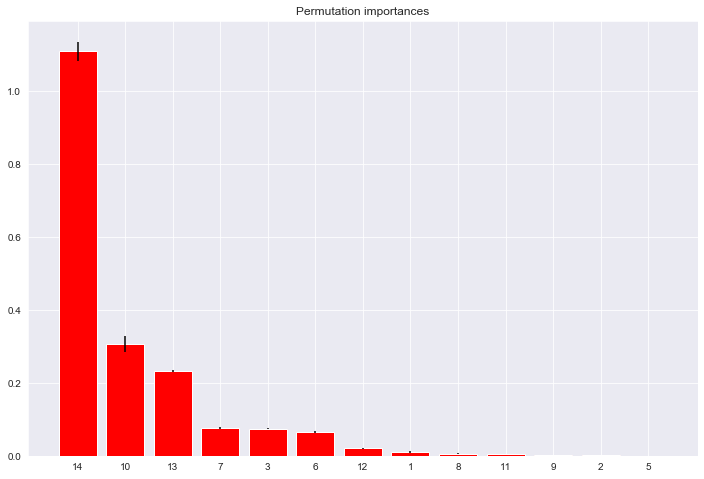

In [131]:
RFimportances(y, X)

- Vaccinations, population density, testing, and female smokers seem to be the strongest features based on these permutation importances for COVID19 outcomes.
- Testing is a special case; it doesn't necessarily affect COVID19 spread but affects our view of the data. 
- Each region has different testing regimes and capacity; therefore confirmed cases may not reflect the true number of COVID19 cases. Higher testing capacity will also mean more total cases.

# Forecasting

# ARIMA forecasting model
- arima will be used to forecast deaths and cases for the next 30 days in Canada
- pdq parameters will be tuned using a wrapper method 
    - source: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7409837/
    - this method tests combinations of pdq values for the lowest AIC

In [93]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA, ARIMAResults
from statsmodels.tsa import stattools
from statsmodels.tsa.stattools import adfuller
from statsmodels.stats.diagnostic import acorr_ljungbox

## ARIMA preprocessing

In [94]:
df.describe()

,total_cases,new_cases,new_cases_smoothed,total_deaths,new_deaths,new_deaths_smoothed,total_cases_per_million,new_cases_per_million,new_cases_smoothed_per_million,total_deaths_per_million,...,gdp_per_capita,extreme_poverty,cardiovasc_death_rate,diabetes_prevalence,female_smokers,male_smokers,handwashing_facilities,hospital_beds_per_thousand,life_expectancy,human_development_index
count,82077.00,82075.00,81074.00,72453.00,72611.00,81074.00,81633.00,81631.00,80635.00,72022.00,...,76085.00,51824.00,76686.00,77791.00,60097.00,59210.00,38532.00,69996.00,79811.00,76577.00
mean,805804.58,5718.14,5692.33,22607.74,137.79,121.93,9810.52,73.74,73.74,220.25,...,19137.64,13.34,257.73,7.82,10.52,32.65,50.92,3.03,73.17,0.73
std,5579207.25,35538.80,34813.79,133563.99,751.19,687.11,18872.37,175.30,148.78,387.00,...,19814.50,19.94,118.75,3.97,10.40,13.48,31.76,2.46,7.55,0.15
min,1.00,-74347.00,-6223.00,1.00,-1918.00,-232.14,0.00,-2153.44,-276.82,0.00,...,661.24,0.10,79.37,0.99,0.10,7.70,1.19,0.10,53.28,0.39
25%,907.00,2.00,6.86,44.00,0.00,0.00,197.46,0.18,1.14,6.76,...,4466.51,0.50,167.29,5.29,1.90,21.60,20.86,1.30,67.92,0.60
50%,10105.00,69.00,84.29,309.00,2.00,1.14,1347.59,7.52,9.92,38.22,...,12951.84,2.20,242.65,7.11,6.30,31.40,49.84,2.40,74.53,0.75
75%,107743.00,755.00,784.68,3000.00,17.00,13.43,9653.64,66.51,74.43,235.57,...,27216.44,21.20,329.63,10.08,19.30,41.10,83.24,3.86,78.73,0.85
max,147189618.00,899755.00,826374.29,3109247.00,17906.00,14435.14,169028.67,8652.66,2648.77,2756.11,...,116935.60,77.60,724.42,30.53,44.00,78.10,99.00,13.80,86.75,0.96


In [96]:
#rolling average for each variable
def cra(country,case='total_cases'):
    ts=df.loc[(df['location']==country)]  
    ts=ts[[case]]
    a=len(ts.loc[(ts[case]>=10)])
    ts=ts[-a:]
    ts.astype('int64')
    return (ts.rolling(window=7,center=False).mean().dropna())


def crplot(country, case='total_cases'):
    ts=df.loc[(df['location']==country)]  
    ts=ts[[case]]
    a=len(ts.loc[(ts[case]>=10)])
    ts=ts[-a:]
    ts.astype('int64')
    
    plt.figure(figsize=(16,6))
    plt.plot(ts[case])
    plt.plot(ts.rolling(window=7,center=False).mean().dropna(),label='Rolling Mean')
    plt.legend(['Cases', 'Rolling Mean'])
    plt.title(f'{country}: Rolling mean and cases for {case}')

## Stationarity testing

In [97]:
c1 = cra('Canada',case='total_cases')

In [98]:
def stationarity(ts):
    print('Augmented Dickey-Fuller test: Canada\'s total_cases')
    test = adfuller(ts, autolag='AIC')
    results = pd.Series(test[0:4], index=['Test Statistic','p-value','Lags Used','Number of Observations'])
    print(results)

stationarity(c1.total_cases.values)

Augmented Dickey-Fuller test: Canada's total_cases
Test Statistic             1.53
p-value                    1.00
Lags Used                 16.00
Number of Observations   404.00
dtype: float64


The p-value tells us the likelihood of stationarity. Because this p-value is over the alpha limit, we cannot reject the null hypothesis that the data contains a unit root, and the data may be non-stationary. 
ARIMA is a good model in this case, with differencing.

Augmented Dickey-Fuller test: Canada's total_cases
Test Statistic             1.53
p-value                    1.00
Lags Used                 16.00
Number of Observations   404.00
dtype: float64


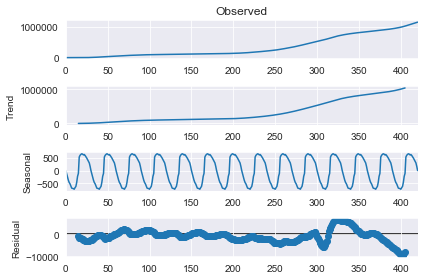

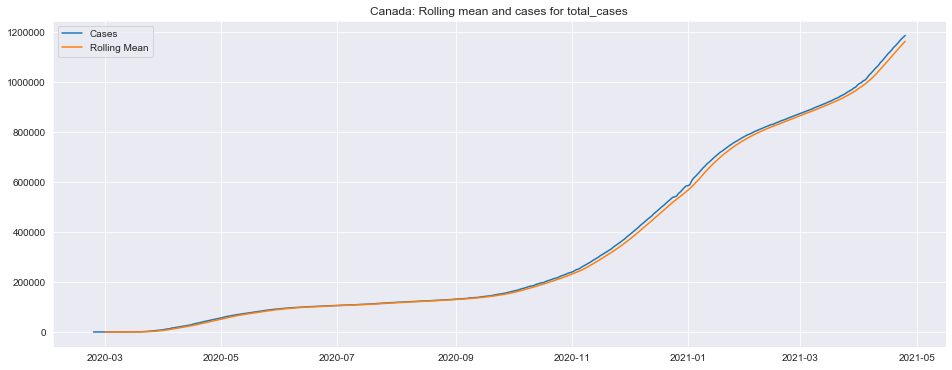

In [99]:
stationarity(cra('Canada').total_cases.values)
fig = sm.tsa.seasonal_decompose(cra('Canada').values, period = 30).plot()
crplot('Canada')

Augmented Dickey-Fuller test: Canada's total_cases
Test Statistic             1.70
p-value                    1.00
Lags Used                 16.00
Number of Observations   395.00
dtype: float64


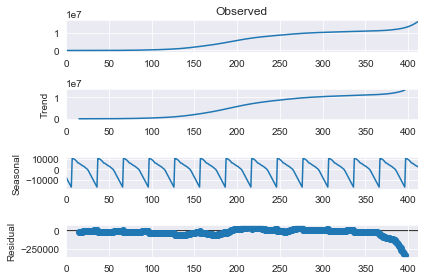

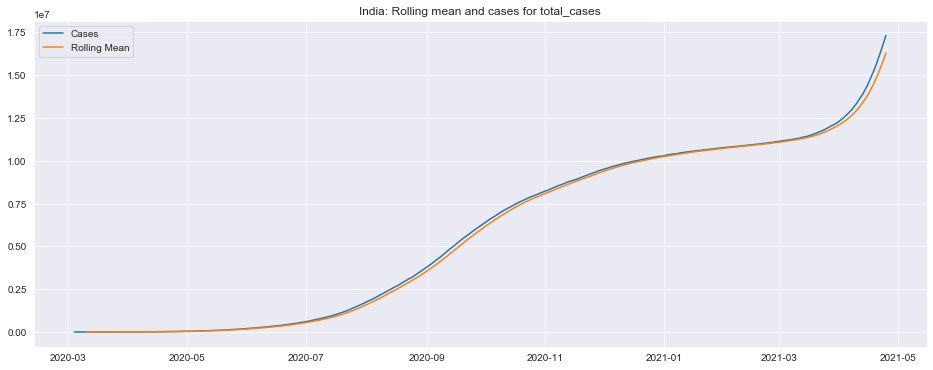

In [100]:
#other countries for curiosity
stationarity(cra('India').total_cases.values)
fig = sm.tsa.seasonal_decompose(cra('India').values, period = 30).plot()
crplot('India')

Augmented Dickey-Fuller test: Canada's total_cases
Test Statistic            -0.61
p-value                    0.87
Lags Used                 18.00
Number of Observations   435.00
dtype: float64


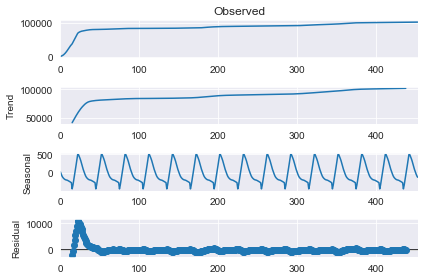

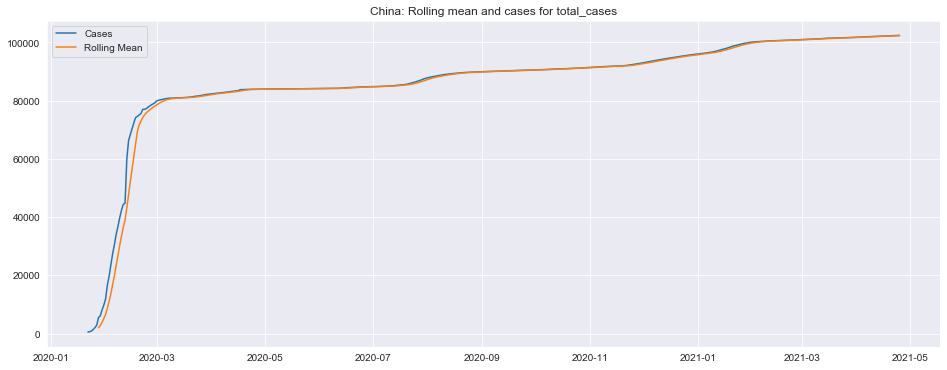

In [101]:
stationarity(cra('China').total_cases.values)
fig = sm.tsa.seasonal_decompose(cra('China').values, period = 30).plot()
crplot('China')

## ACF and PACF

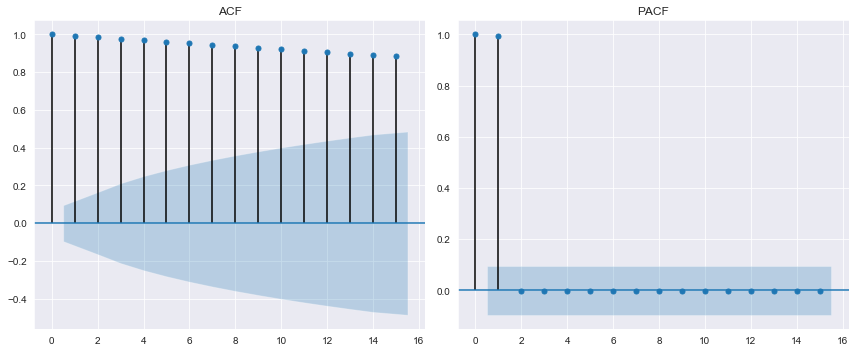

In [102]:
def autocorr(ts):
    plt.figure(figsize=(12,5))
    layout = (1, 2)
    
    ax_acf= plt.subplot2grid(layout, (0, 0))
    ax_pacf = plt.subplot2grid(layout, (0, 1))
    
    plot_acf(ts, lags=15, title='ACF', ax=ax_acf)
    plot_pacf(ts, lags=15, title='PACF', ax=ax_pacf)
    plt.tight_layout()
    
autocorr(cra('Canada'))
#ACF and PACF for Canada;

## ARIMA Modeling
- predictions using the model will be 30 days from today

In [103]:
from math import sqrt

In [104]:
#Train-test splitting on time series data
def split(ts):
    date = int(len(ts) * 0.85)
    train = ts[:date]
    test = ts[date:]
    return(train, test)

#(p,D,q) hyperparameter evaluation based on AIC
def arima(ts,test):
    p = d = q = range(0,6)
    x = 100000
    pdq = list(itertools.product(p,d,q))
    
    for combo in pdq:
        try:
            model = ARIMA(ts, order=combo)
            result = model.fit()
            if (result.aic <= x):
                x = result.aic
                param = combo
        except:
            continue
    return param

def rmse(y1, y_pred):
    y1, y_pred = np.array(y1), np.array(y_pred)
    return sqrt(mean_squared_error(y1, y_pred))

def mape(y1, y_pred): 
    y1, y_pred = np.array(y1), np.array(y_pred)
    return np.mean(np.abs((y1 - y_pred) / y1)) * 100

def ARIMAmodel(country, case):
    c1 = cra(country, case)
    series = c1[case].values
    train,test=split(series)
    pdq = arima(train,test)

    #Modeling
    model = ARIMA(train, order=pdq)
    result = model.fit()
    return result


In [106]:
def ARIMAfigs(result, case, days = 30):
    
    c = cra('Canada',case=case)
    train, test = split(c[case].values)
    z, y = np.hstack(train), np.hstack(test)
    length = len(z) + len(y)
    zy = pd.DataFrame({'x':range(len(z)-10,len(z)+len(y)-10), 'y':y})
    zy.set_index('x', inplace=True)
    
    plt.figure(figsize=(15,10))
    layout=(1,1)

    #days forecasted
    forecast = plt.subplot2grid(layout, (0,0))
    plt.setp(forecast, 
             xticks=[0,length/5,(length/5)*2,(length/5)*3,(length/5)*4,length-10,length+days],
             xticklabels=[str(c.index.min())[:10],'','','','',str(c.index.max())[:10],''])
    
    #Predict the test set + next 30 days
    result.plot_predict(start=10, end=length+days, ax=forecast)
    forecast.legend(fontsize='xx-large', loc='upper left')
    forecast.tick_params(axis='x', labelsize=15)
    forecast.tick_params(axis='y', labelsize=13)
    forecast.set_ylabel(f'COVID19 {case}', fontsize=15)
    forecast.set_title(f'ARIMA Model Predictions for COVID19 {case} in Canada', fontsize=20 )
    pred=result.forecast(steps=len(test))[0]
    
    #Model Error plots
    fig, ax = plt.subplots(1, 2, figsize=(16,4))

    ax[0].plot(pred, c='#1f77b4', label = 'Predicted')
    ax[0].plot(test, c='r', label = 'Actual')
    forecast.plot(zy, c='r', label = 'Actual')
    ax[1].plot(pred-y, c='purple', label = 'Residuals', marker='*')
    plt.setp(ax[0], xticks=[0, len(pred)], xticklabels=[str(c.index[len(z)+1])[:10], str(c.index.max())[:10]])
    ax[1].tick_params(axis='x', labelsize=13)
    fig.suptitle('ARIMA Model error', fontsize=20 )
    
    ax[1].annotate(f"RMSE:{rmse(test,pred):.3f}\nMAPE:{mape(test,pred):.3f}\n",
                   xy=(0.05, 0.55), fontsize=15,
                   xycoords = 'axes fraction', xytext=(0.05,0.55))
    
    forecast.legend(['Forecast', 'Actual', 'Actual(test set)', '95% CI'], loc = 'upper left', fontsize='xx-large')
    ax[0].legend(loc='upper left', fontsize='x-large')
    ax[1].legend(loc='upper left', fontsize='x-large')
    
    #creating the predictions list
    datelist = pd.date_range(c.index.max(), periods=days).tolist()
    dates = []
    for date in datelist:
        dates.append(str(date)[:10])
    oospred = result.forecast(steps=len(test)+days)[0]
    fpreds = pd.DataFrame({'Date':dates,'OOS Preds':oospred[len(test):]})
    
    print(result.summary(), '\n')
    print('Evaluation metrics:\n'
          f"RMSE:{rmse(test,pred):.3f}\n"
          f"MAPE:{mape(test,pred):.3f}\n")
    print(f'{days} day predictions\n', fpreds)

In [107]:
model_td = ARIMAmodel(country='Canada', case='total_deaths')
model_tc = ARIMAmodel(country='Canada', case='total_cases')

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-pack

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

C:\Users\Ramello\anaconda3\lib\site-packages\statsmodels\base\model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  355
Model:                 ARIMA(5, 2, 5)   Log Likelihood               -2220.918
Method:                       css-mle   S.D. of innovations            124.084
Date:                Tue, 27 Apr 2021   AIC                           4465.836
Time:                        02:17:24   BIC                           4512.301
Sample:                             2   HQIC                          4484.321
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          8.2375     16.198      0.509      0.611     -23.511      39.986
ar.L1.D2.y     0.2907      0.100      2.908      0.004       0.095       0.487
ar.L2.D2.y     0.2744      0.057      4.852      0.0

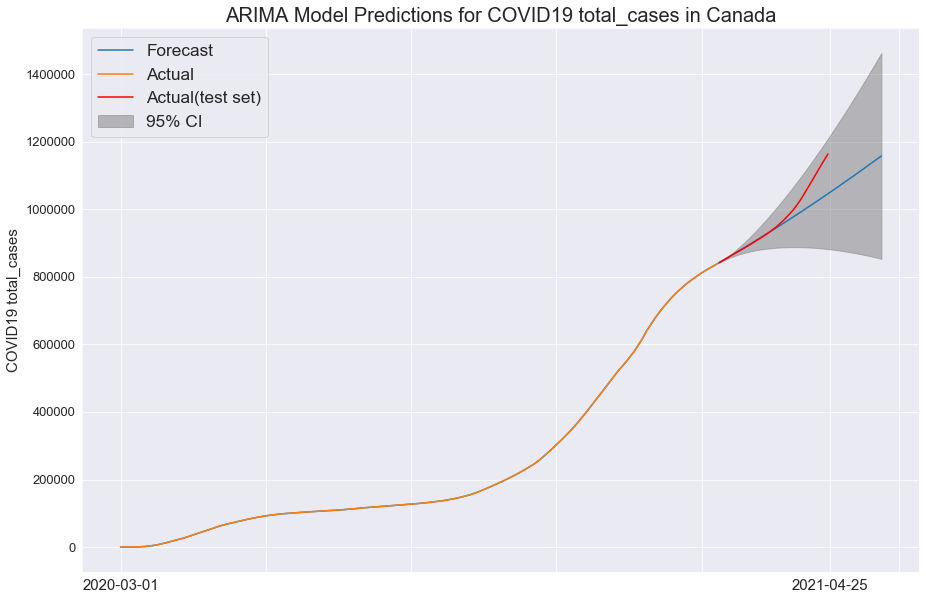

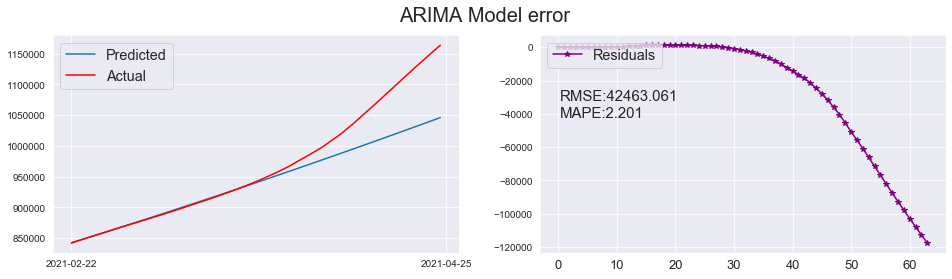

In [109]:
ARIMAfigs(model_tc, case='total_cases')

                             ARIMA Model Results                              
Dep. Variable:                   D2.y   No. Observations:                  336
Model:                 ARIMA(4, 2, 5)   Log Likelihood                -865.990
Method:                       css-mle   S.D. of innovations              3.100
Date:                Tue, 27 Apr 2021   AIC                           1753.981
Time:                        02:17:34   BIC                           1795.969
Sample:                             2   HQIC                          1770.719
                                                                              
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2055      0.914      0.225      0.822      -1.585       1.996
ar.L1.D2.y    -0.8157      0.052    -15.756      0.000      -0.917      -0.714
ar.L2.D2.y     0.2558      0.055      4.626      0.0

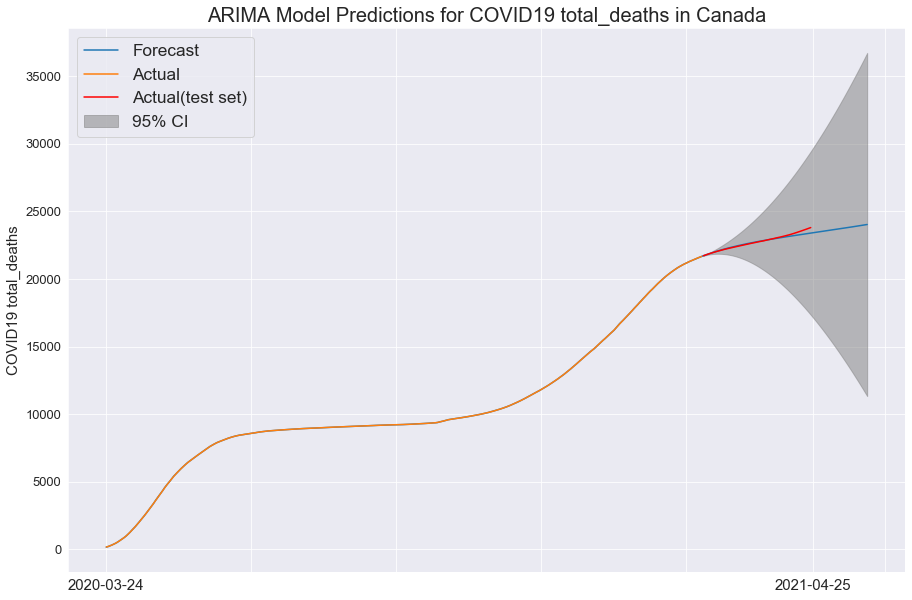

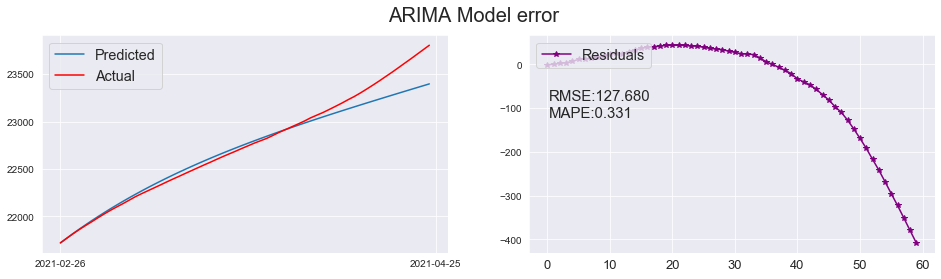

In [110]:
ARIMAfigs(model_td, case='total_deaths')

- The ARIMA(5,2,5) for cases and ARIMA(5,2,4) for deaths were relatively robust for the first 30 days and predicted the trajectory of COVID19 with moderate succuss
- ARIMA as a time series model is very useful, but with a pandemic like COVID19, a multivariate approach may be better

# Summary
Analysis of pandemic data is crucial for preparation of the next pandemic event.
From this analysis I gather that: 
- Key demographic factors for COVID19 outcomes are median age, smoker population, population density. 
- Key mitigators are hospital beds per thousand, and total vaccinations.
